In [1]:
# procedure for calculating surface settlements along a tunnel
# completed procedure will in the form of a design report
#   forecast settlements

# project name: 'Test'

In [2]:
# import libraries
from numpy import *
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# set maximum number of rows to display from a pandas data frame
#pd.set_option('display.max_rows', 3000)
pd.set_option('display.max_rows', 30000)

In [4]:
# set up plotly in 'offline' mode                            #ToDo JK: this should be cleaned up and documented
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot,iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
print (__version__) # requires version >= 1.9.0

# collect all plotly setups here
import plotly.offline as plotly  #testing
from plotly.graph_objs import *  #testing

2.2.1


In [5]:
# set wd for this procedure and project 
import sys, os
os.chdir("/home/kaelin_joseph/TunnelGIS")

In [6]:
# define required input files
# import cataFrame with calculated results from Tunnel GIS
align_data_df = pd.read_csv('data/in/Ostroehre.TunnelExcavationData.R3.csv',index_col=0)

In [7]:
# define required input data
# basic tunnel data
D = 13.0            #tunnel diameter (m)
A = pi*(D/2.0)**2   #tunnel excavation cross-section (m2)
d_offset = 2.0      #distance from alignment elevation to tunnel centreline                         #confrim !!
# d = distance between ground surface and tunnel centerline is calculated from input in 'align_data_df'

# data for settlment calculation based on FE-calculation
# d_rock = rock cover above tunnel crown (m) is calculated from RockCover 'align_data_df'
#   RockCover = RockSurface - Elevation
gamma = 20.0        #ground ensity (kN/m3)
#p_supp = 0.4 * d * gamma  #face support pressure

#range and resolution for points along cross-section
#res = 2.0
res = 5.0  #for faster testing
l_range, r_range = 40.0, 40.0

In [8]:
# define temporary data


In [9]:
# define output files
# create dataframe for results of settlement calculations
settlements_df = pd.DataFrame()

In [10]:
align_data_df

,Station,Easting,Northing,Elevation,DTM,RockSurface,StationReal,RockCover,WBScode,WorkType,...,ProfileType,SectionArea,Description,Unit,BoreClass,SupportClass,DisposalClass,StationInterval,ExcavationVolume,DisposalVolume
0,204+874.1,2612071.548,1269294.122,270.962,253.524,236.000,204874.100,-34.962,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,0.899819,NaN,NaN
1,204+875,2612072.229,1269294.710,270.975,253.524,236.000,204875.000,-34.975,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.000272,NaN,NaN
2,204+880,2612076.083,1269297.895,271.047,253.160,236.000,204880.000,-35.047,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.000597,NaN,NaN
3,204+885,2612080.052,1269300.936,271.120,252.934,235.815,204885.000,-35.305,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.000709,NaN,NaN
4,204+890,2612084.131,1269303.828,271.192,252.934,235.815,204890.000,-35.377,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,4.999657,NaN,NaN
5,204+895,2612088.313,1269306.567,271.265,252.574,235.815,204895.000,-35.450,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.000403,NaN,NaN
6,204+900,2612092.594,1269309.150,271.337,252.013,235.707,204900.000,-35.630,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.000813,NaN,NaN
7,204+905,2612096.968,1269311.573,271.410,251.805,235.707,204905.000,-35.703,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,4.999546,NaN,NaN
8,204+910,2612101.427,1269313.833,271.482,251.631,235.707,204910.000,-35.775,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.001084,NaN,NaN
9,204+915,2612105.968,1269315.927,271.555,251.149,235.707,204915.000,-35.848,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,4.999596,NaN,NaN


In [11]:
len(align_data_df.index)
#align_data_df.count()

922

In [12]:
# calculate settlements at stationed points along tunnel alignment
settlements_df = pd.DataFrame()  #initialize df
for i in range(len(align_data_df.index) - 1): #iterate over stationed points in align_data_df
    # read values which are needed for calculation of point a at i into a numpy array
    pt_a = array([align_data_df['Easting'][i], align_data_df['Northing'][i], align_data_df['Elevation'][i], 
                   align_data_df['DTM'][i], align_data_df['RockCover'][i]])
    pt_a = asfarray(pt_a,float)  #return an array converted to float type
    stat = align_data_df['Station'][i]
    d_rock = pt_a[4] - d_offset - D/2
    # read in the values which are needed for calculation of point b at i+1
    pt_b = array([align_data_df['Easting'][i+1], align_data_df['Northing'][i+1],
                   align_data_df['Elevation'][i+1], align_data_df['DTM'][i+1], align_data_df['RockCover'][i+1]])
    pt_b=asfarray(pt_b,float)
    d = pt_a[3] - (pt_a[2] + d_offset)  #depth from surace DTM to elevation of tunnel centreline

    # only calculate settlements if TBM excavation
    if 'TBM' not in str(align_data_df['ProfileType'][i]):
        continue

    # check that overburden is within assumptions for calculation method    
    if d < D: #if the overburden is < D/2, no calculation at this station
        print('overburden at Sta '+stat+' less than D/2', 'd: '+str(d))
        continue
    
    # define normal vector (cross-section) to alignment at point a              #ToDo JK -make into function ?
    v_ab = array([pt_b[0] - pt_a[0], pt_b[1] - pt_a[1]])  #vector between point i and i+1
    nv_ab = array([-v_ab[1], v_ab[0]])  #normal vector to alginment at point a
    norm = (nv_ab[0]**2 + nv_ab[1]**2)**0.5  #magnitude of normal vector
    nnv_ab = nv_ab / norm  #unit normal vector

    # define points along cross-section
    xs_pts = arange(-l_range, r_range+res, res)
    X_i = pt_a[0] + nnv_ab[0]*xs_pts  #list of x-coords along cross-section
    Y_i = pt_a[1] + nnv_ab[1]*xs_pts  #list of x-coords along cross-section

    # testing
    #print('i= ', i)
    #print('v_ab: ', v_ab)
    #print('nv_ab: ', nv_ab)
    #print('X_i: ', X_i)
    #print('Y_i: ', Y_i)

    
    # calculate settlement trough with gauss curve assumption #ToDo: make all of this a function outside of loop
    # empirical estimates of calculation coefficients
    # these coeff's are for bored tunnels in soil and will generally depend on value of d_rock
    c_v = array([0.004]) #empirical value for lost ground as fraction of excavation area
    c_i = array([0.5]) #empirical coeff to estimate distance centerline to inflection point of gauss curve
    
    # calculate intermediate results (d assumed constant along cross-section)
    vol_loss = A * c_v
    infl_len = d * c_i
    
    # calculte settlement at centerline
    setl_max = vol_loss / (sqrt(2*pi) * infl_len)
    # calculate settlment at distance x along gauss curve                #ToDo: lambda or function preferred ?
    setl = lambda x: (
        setl_max * exp(- x**2 / (2 * infl_len**2)) )
    S = -setl(xs_pts)  #numpy array of settlements along a cross-section
    #print(S)    

    
    # cacluclate differential settlements 
    S_diff=zeros((len(S)))  #return a new numpy array filled with zeros
    S_diff[1:]=abs((diff(S)/res))  #inclination of settlement trough
                                   # [1:] is python array slice notation: start at index 1
                                   # diff() is numpy function to calculate discrete differences
    S_diff[0]=S_diff[len(S_diff)-1]  #symmetry of gauss curve used to populate initial value
    
    # write results to df
    calc_results = {'station':stat,
                    'x_station':pt_a[0],
                    'y_station':pt_a[1],
                    'x-sect_x': X_i,
                    'x-sect_y': Y_i,
                    'settlement [mm]': S*1000,
                    'diff_settle': S_diff,
                    'depth': d,
                    'd_rock': d_rock}
    
    calc_results_df = pd.DataFrame(calc_results)

    #append the calculated values to the dataframe
    settlements_df=settlements_df.append(calc_results_df)    
    
# safe settlements_df dataframe to .csv
settlements_df.to_csv('data/out/Settlement.csv')
print('run complete')

('overburden at Sta 208+570 less than D/2', 'd: 12.978000000000037')
('overburden at Sta 208+575 less than D/2', 'd: 12.902000000000044')
('overburden at Sta 208+580 less than D/2', 'd: 12.863999999999976')
('overburden at Sta 208+585 less than D/2', 'd: 12.496999999999986')
('overburden at Sta 208+590 less than D/2', 'd: 12.396000000000015')
('overburden at Sta 208+595 less than D/2', 'd: 12.45100000000005')
('overburden at Sta 208+600 less than D/2', 'd: 12.108000000000061')
('overburden at Sta 208+605 less than D/2', 'd: 12.008000000000038')
('overburden at Sta 208+610 less than D/2', 'd: 12.077999999999975')
('overburden at Sta 208+615 less than D/2', 'd: 12.27899999999994')
('overburden at Sta 208+616.813 less than D/2', 'd: 12.527000000000015')
run complete


In [13]:
#settlements_df.head()
#len(settlements_df)
settlements_df

,d_rock,depth,diff_settle,settlement [mm],station,x-sect_x,x-sect_y,x_station,y_station
0,-18.054,14.248,3.326416e-08,-4.240206e-06,205+520,2.612456e+06,1.268897e+06,2612490.971,1268916.643
1,-18.054,14.248,3.326416e-08,-1.705610e-04,205+520,2.612461e+06,1.268899e+06,2612490.971,1268916.643
2,-18.054,14.248,8.043242e-07,-4.192182e-03,205+520,2.612465e+06,1.268902e+06,2612490.971,1268916.643
3,-18.054,14.248,1.175366e-05,-6.296049e-02,205+520,2.612469e+06,1.268904e+06,2612490.971,1268916.643
4,-18.054,14.248,1.029642e-04,-5.777817e-01,205+520,2.612474e+06,1.268907e+06,2612490.971,1268916.643
5,-18.054,14.248,5.324169e-04,-3.239866e+00,205+520,2.612478e+06,1.268909e+06,2612490.971,1268916.643
6,-18.054,14.248,1.572206e-03,-1.110090e+01,205+520,2.612482e+06,1.268912e+06,2612490.971,1268916.643
7,-18.054,14.248,2.428040e-03,-2.324109e+01,205+520,2.612487e+06,1.268914e+06,2612490.971,1268916.643
8,-18.054,14.248,1.298162e-03,-2.973190e+01,205+520,2.612491e+06,1.268917e+06,2612490.971,1268916.643
9,-18.054,14.248,1.298162e-03,-2.324109e+01,205+520,2.612495e+06,1.268919e+06,2612490.971,1268916.643


In [24]:
# plot plan view of settlements as heat map along tunnel

alignment_stationed_line_plot = go.Scatter(
    x=align_data_df['Easting'].tolist(),
    y=align_data_df['Northing'].tolist(),
    line=dict(width=1,
              color='green'
             ),
    name ="alignment_stationed_line",
    #hoverinfo = 'none',
    hoverinfo = 'text',
    text = align_data_df['Station'].tolist(),
)

cross_section_point_plot = go.Scatter(
    x=settlements_df['x-sect_x'].tolist(),
    y=settlements_df['x-sect_y'].tolist(),
    mode = "markers",
    name = "section_points",
    hoverinfo = 'none',

    marker = dict(
        size = 5,
        color = settlements_df['settlement [mm]'].tolist(),

        # testing colorscales
        #colorscale='Viridis',        
        #colorscale='Jet',
        #colorscale=[[0.0, 'rgb(165,0,38)'], [0.1111111111111111, 'rgb(215,48,39)'], [0.2222222222222222, 'rgb(244,109,67)'],
        #[0.3333333333333333, 'rgb(253,174,97)'], [0.4444444444444444, 'rgb(254,224,144)'], [0.5555555555555556, 'rgb(224,243,248)'],
        #[0.6666666666666666, 'rgb(171,217,233)'],[0.7777777777777778, 'rgb(116,173,209)'], [0.8888888888888888, 'rgb(69,117,180)'],
        #[1.0, 'rgb(49,54,149)']],
        colorscale = 'Hot',
        
        colorbar=ColorBar(              #legend
                title = 'Settlements (mm)',
                len = 0.5)
    )
)

data = [alignment_stationed_line_plot, cross_section_point_plot]
layout = go.Layout(yaxis=dict(scaleanchor="x", scaleratio=1))
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='settlement-plot')

In [23]:
# plot plan view of diffetnial settlements as heat map along tunnel

alignment_stationed_line_plot = go.Scatter(
    x=align_data_df['Easting'].tolist(),
    y=align_data_df['Northing'].tolist(),
    line=dict(width=1,
              color='green'
             ),
    name ="alignment_stationed_line",
    #hoverinfo = 'none',
    hoverinfo = 'text',
    text = align_data_df['Station'].tolist(),
)

cross_section_point_plot = go.Scatter(
    x=settlements_df['x-sect_x'].tolist(),
    y=settlements_df['x-sect_y'].tolist(),
    mode = "markers",
    name = "section_points",
    hoverinfo = 'none',

    marker = dict(
        size = 5,
        color = settlements_df['diff_settle'].tolist(),

        # testing colorscales
        colorscale='Viridis',        
        #colorscale='Jet',
        #colorscale=[[0.0, 'rgb(165,0,38)'], [0.1111111111111111, 'rgb(215,48,39)'], [0.2222222222222222, 'rgb(244,109,67)'],
        #[0.3333333333333333, 'rgb(253,174,97)'], [0.4444444444444444, 'rgb(254,224,144)'], [0.5555555555555556, 'rgb(224,243,248)'],
        #[0.6666666666666666, 'rgb(171,217,233)'],[0.7777777777777778, 'rgb(116,173,209)'], [0.8888888888888888, 'rgb(69,117,180)'],
        #[1.0, 'rgb(49,54,149)']],
        #colorscale = 'Hot',
        
        colorbar=ColorBar(              #legend
                title = 'Differential Settlements s/l',
                len = 0.5)
    )
)

data = [alignment_stationed_line_plot, cross_section_point_plot]
layout = go.Layout(yaxis=dict(scaleanchor="x", scaleratio=1))
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='settlement-plot')

In [16]:
# set index for df (only do once)
settlements_df.set_index("station", inplace=True)

In [17]:
# set station for plot of settlment trough (use station from hover on plan view)
stat_monitor = '208+525'

test_list = settlements_df.loc[[stat_monitor], ['settlement [mm]']]
test_filtered = array(test_list['settlement [mm]'].tolist())
print(test_filtered)

[-1.77296140e-06 -8.80586388e-05 -2.59837381e-03 -4.55499882e-02
 -4.74386019e-01 -2.93516466e+00 -1.07892196e+01 -2.35615886e+01
 -3.05686375e+01 -2.35615886e+01 -1.07892196e+01 -2.93516466e+00
 -4.74386019e-01 -4.55499882e-02 -2.59837381e-03 -8.80586388e-05
 -1.77296140e-06]


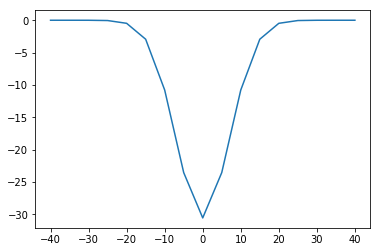

In [18]:
# plot settlement results
fig=plt.figure()

p1 = plt.plot(xs_pts, test_filtered) 

plt.show()

In [19]:
# set station for plot of differential settlments for checking

stat_monitor = '205+530'

test_list = settlements_df.loc[[stat_monitor], ['diff_settle']]
test_filtered = array(test_list['diff_settle'].tolist()[1:])  #index=0 was set to zero above
print(test_filtered)

[7.78536302e-08 1.47879866e-06 1.75874753e-05 1.29869659e-04
 5.86076246e-04 1.56327343e-03 2.25639369e-03 1.16635816e-03
 1.16635816e-03 2.25639369e-03 1.56327343e-03 5.86076246e-04
 1.29869659e-04 1.75874753e-05 1.47879866e-06 7.78536302e-08]


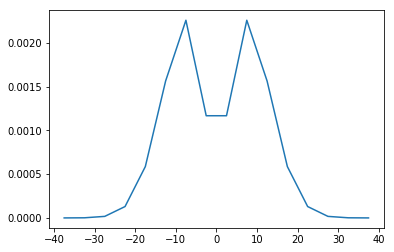

In [20]:
# plot differential settlments
fig=plt.figure()

xs_pts_plt = xs_pts[1:]
xs_pts_plt = xs_pts_plt -res/2

p1 = plt.plot(xs_pts_plt, test_filtered) 

plt.show()

In [21]:
data =[]    

z_dtm_align = go.Scatter(
    x=align_data_df['StationReal'].tolist(),
    y=align_data_df['DTM'].tolist(),
    name = "Terrain",
    mode='lines',
    line=dict(width=0.5,
              #color='rgb(196, 97, 26)'
             ),
    fill='tozeroy'
)
data.append(z_dtm_align)


z_rock_align = go.Scatter(
    x=align_data_df['StationReal'].tolist(),
    y=align_data_df['RockSurface'].tolist(),
    name = "Rock",
    mode='lines',
    line=dict(width=0.5,
              #color='rgb(196, 97, 26)'
             ),
    fill='tonexty'
)
data.append(z_rock_align)

c = []
for i in range(len(align_data_df.index)):
    if 'TBM' in str(align_data_df['ProfileType'][i]):
      c.append('green')  
    else:
      c.append('black')  

#z_align_line
for i in range(len(align_data_df.index)-1):
    z_align_crown = go.Scatter(
        x = (align_data_df['StationReal'][i], align_data_df['StationReal'][i+1]),
        y = (align_data_df['Elevation'][i] + d_offset +D/2, align_data_df['Elevation'][i+1] + d_offset +D/2),
        mode = 'lines',
        line = dict(
            width = 3,
            color = c[i],
            ),
        name ="Tunnel",
        showlegend=False,
    )
    data.append(z_align_crown)
    
for i in range(len(align_data_df.index)-1):
    z_align_invert = go.Scatter(
        x = (align_data_df['StationReal'][i], align_data_df['StationReal'][i+1]),
        y = (align_data_df['Elevation'][i] + d_offset -D/2, align_data_df['Elevation'][i+1] + d_offset -D/2),
        mode = 'lines',
        line = dict(
            width = 3,
            color = c[i],
            ),
        name ="Tunnel",
        showlegend=False,
    )
    data.append(z_align_invert)    
     
# z_align_line = go.Scatter(
#     x=align_data_df['StationReal'].tolist(),
#     y=align_data_df['Elevation'].tolist(),
#     line=dict(width=3,
#              color='rgb(0, 0, 0)',
#              ),
#     name ="Tunnel"
# )


#data = [z_dtm_align, z_rock_align, z_align_line]


layout = go.Layout(
    title='Longitudinal Section',
    #showlegend=True,
    xaxis=dict(
        title= "Stationing",
    ),
    yaxis=dict(
        title = "m a.s.l.",
        range = [180,300]
    ),
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='stacked-area-plot')